# LOCKED POSITION RANDOMIZED DATA

FILENAME: budget_randomized.ipynb
    
PROJECT: Randomized Data Model

DATE CREATED: 27-MAY-20

DATE UPDATED: 3-AUG-20

## PHASE 1: PROJECT SETUP

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

Import the necessary libraries needed for ETL, engineering, and export efforts

In [2]:
import pandas as pd
import csv
import random
import sqlite3
import itertools
import numpy as np
import datetime
from itertools import repeat
import time as t
import getpass as gp

# plotting modules
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.offline as po
import plotly.graph_objects as go

import networkx as nx

Create a function which creates a dataframe with a length 'df_length' and randomizes the distribution of values as each year progresses

- Column names include: 'projects', 'subprojects', 'programs', 'rca'
- Budget years include:  'year 3 forecast', 'year 2 forecast', 'year 1 forecast', 'planned value', 'appropriation value', 'obligated value'



In [3]:
def init_array(df_length):
    '''
    DESCRIPTION: A function to create and return a two_dimensional array with randomized float values
    '''
    
    length = df_length
    
    num_of_projects = 20 # can change the amount of projects
    num_of_subprojects = 40 # can change the amount of subprojects
    num_of_programs = 80
    num_of_rca = 120 # can change the amount of RCAs
    
    # create a sequential list of column values for projects, subprojects, and RCAs
    proj_list = ['project-' + str(i+1) for i in range(num_of_projects)] # create a list of project names
    subproject_list = ['subproject-' + str(i+1) for i in range(num_of_subprojects)]
    program_list = ['program-' + str(i+1) for i in range(num_of_programs)]
    rca_list = ['rca-' + str(i+1) for i in range(num_of_rca)]
    
    project_values = []
    subproject_values = []
    program_values = []
    rca_values = []

    for index in range(length):
        
        # select a random value from each list
        proj_val = random.choice(proj_list)
        sb_val = (random.choice(subproject_list))
        program_val = random.choice(program_list)
        rca_val = random.choice(rca_list)
        
        # append the randomized value to the default list
        project_values.append(proj_val)
        subproject_values.append(sb_val)
        program_values.append(program_val)
        rca_values.append(rca_val)
    
    # create randomized budget data
    yr3_forecast= np.random.randint(low = 1000, high = 30000, size = df_length) 
    yr2_random = np.random.uniform(low=0.5, high=1.3, size=df_length)
    yr2_forecast = np.round(yr3_forecast * yr2_random,2)
    
    yr1_random = np.random.uniform(low=0.8, high=1.2, size=df_length)
    yr1_forecast = np.round(yr2_forecast * yr1_random,2)
    
    plan_random = np.random.uniform(low=0.6, high=1.3, size=df_length)
    plan_val = np.round(yr1_forecast * plan_random,2)
    
    approp_random = np.random.uniform(low=0.6, high=1.2, size=df_length)
    approp_val = np.round(plan_val * approp_random,2)
    
    oblig_random = np.random.uniform(low=0.8, high=1.0, size=df_length)
    oblig_val = np.round(approp_val * oblig_random,2)
    
    raw_df = pd.DataFrame(columns=['project', 'subproject', 'program_title', 'rca','yr+3_forecast','yr+2_forecast','yr+1_forecast','yr0_plan','yr-1_approp','yr-2_oblig'])

    raw_df['project'] = project_values
    raw_df['subproject'] = subproject_values
    raw_df['program_title'] = program_values
    raw_df['rca'] = rca_values
    raw_df['yr+3_forecast'] = yr3_forecast
    raw_df['yr+2_forecast'] = yr2_forecast
    raw_df['yr+1_forecast'] = yr1_forecast
    raw_df['yr0_plan'] = plan_val
    raw_df['yr-1_approp'] = approp_val
    raw_df['yr-2_oblig'] = oblig_val
    
    return raw_df

In [4]:
def genSankey(df,cat_cols=[],value_cols='',title='Sankey Diagram'):
    # maximum of 6 value cols -> 6 colors
    colorPalette = ['#4B8BBE','#306998','#FFE873','#FFD43B','#646464']
    labelList = []
    colorNumList = []
    for catCol in cat_cols:
        labelListTemp =  list(set(df[catCol].values))
        colorNumList.append(len(labelListTemp))
        labelList = labelList + labelListTemp
        
    # remove duplicates from labelList
    labelList = list(dict.fromkeys(labelList))
    
    # define colors based on number of levels
    colorList = []
    for idx, colorNum in enumerate(colorNumList):
        colorList = colorList + [colorPalette[idx]]*colorNum
        
    # transform df into a source-target pair
    for i in range(len(cat_cols)-1):
        if i==0:
            sourceTargetDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            sourceTargetDf.columns = ['source','target','count']
        else:
            tempDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            tempDf.columns = ['source','target','count']
            sourceTargetDf = pd.concat([sourceTargetDf,tempDf])
        sourceTargetDf = sourceTargetDf.groupby(['source','target']).agg({'count':'sum'}).reset_index()
        
    # add index for source-target pair
    sourceTargetDf['sourceID'] = sourceTargetDf['source'].apply(lambda x: labelList.index(x))
    sourceTargetDf['targetID'] = sourceTargetDf['target'].apply(lambda x: labelList.index(x))
    
    # creating the sankey diagram
    data = dict(
        type='sankey',
        node = dict(
          pad = 15,
          thickness = 20,
          line = dict(
            color = "black",
            width = 0.5
          ),
          label = labelList,
          color = colorList
        ),
        link = dict(
          source = sourceTargetDf['sourceID'],
          target = sourceTargetDf['targetID'],
          value = sourceTargetDf['count']
        )
      )
    
    layout =  dict(
        title = title,
        font = dict(
          size = 10
        )
    )
       
    fig = dict(data=[data], layout=layout)
    return fig



# PHASE 2: FUNCTION TEST

In [5]:
train_df = init_array(10000)
train_df.tail(10)

,project,subproject,program_title,rca,yr+3_forecast,yr+2_forecast,yr+1_forecast,yr0_plan,yr-1_approp,yr-2_oblig
9990,project-17,subproject-39,program-57,rca-110,17407,18691.85,19653.87,19158.38,22056.79,21676.56
9991,project-20,subproject-10,program-37,rca-67,22328,21693.78,20689.73,24626.33,21234.90,18899.20
9992,project-9,subproject-25,program-27,rca-90,11697,8921.66,10496.48,11591.62,11152.24,9268.18
9993,project-13,subproject-33,program-51,rca-120,23404,29344.30,24743.60,29144.55,28720.56,26575.79
9994,project-15,subproject-29,program-14,rca-60,3706,4094.82,4487.18,4886.53,4797.65,3962.40
9995,project-17,subproject-6,program-77,rca-21,18618,21527.35,25549.37,31702.33,21401.73,19751.16
9996,project-5,subproject-25,program-66,rca-46,20143,10872.26,9503.25,10754.11,12451.37,11665.45
9997,project-18,subproject-13,program-61,rca-15,23909,13093.83,13899.59,16347.71,10988.95,10122.34
9998,project-9,subproject-9,program-18,rca-78,10915,6915.18,6228.02,5034.08,5626.93,4865.09
9999,project-8,subproject-23,program-66,rca-75,18585,14959.12,16441.24,18492.66,14705.35,13414.59


In [6]:
train_df['key'] = train_df['project'] + '-' + train_df['subproject'] + '-' + train_df['program_title'] + '-' + train_df['rca']
train_df['key']


0        project-19-subproject-2-program-55-rca-69
1       project-16-subproject-35-program-28-rca-79
2       project-16-subproject-30-program-54-rca-50
3        project-5-subproject-22-program-46-rca-47
4        project-7-subproject-17-program-59-rca-60
                           ...                    
9995     project-17-subproject-6-program-77-rca-21
9996     project-5-subproject-25-program-66-rca-46
9997    project-18-subproject-13-program-61-rca-15
9998      project-9-subproject-9-program-18-rca-78
9999     project-8-subproject-23-program-66-rca-75
Name: key, Length: 10000, dtype: object

In [7]:
key_df = train_df[['key']]
duplicateRowsDF = key_df[key_df.duplicated()]
 
print("Duplicate Rows except first occurrence based on all columns are :")
print(duplicateRowsDF)

print("Total count of duplicated rows :")
print(len(duplicateRowsDF))

Duplicate Rows except first occurrence based on all columns are :
                                            key
3549  project-1-subproject-39-program-42-rca-23
5344   project-15-subproject-7-program-6-rca-47
7226   project-3-subproject-22-program-9-rca-82
8879  project-2-subproject-18-program-15-rca-29
Total count of duplicated rows :
4


In [8]:
# dropping ALL duplicte values 
train_df.drop_duplicates(subset ="key", 
                     keep = False, inplace = True) 


In [9]:
key_df = train_df[['key']]
duplicateRowsDF = key_df[key_df.duplicated()]
 
print("Duplicate Rows except first occurrence based on all columns are :")
print(duplicateRowsDF)

print("\nTotal count of duplicated rows :",len(duplicateRowsDF))


Duplicate Rows except first occurrence based on all columns are :
Empty DataFrame
Columns: [key]
Index: []

Total count of duplicated rows : 0


### Store unique values in data structures

In [10]:
budget_col_names = list(train_df.columns)
budget_col_names

['project',
 'subproject',
 'program_title',
 'rca',
 'yr+3_forecast',
 'yr+2_forecast',
 'yr+1_forecast',
 'yr0_plan',
 'yr-1_approp',
 'yr-2_oblig',
 'key']

In [11]:
budget_ordinal_names = budget_col_names[:4]
budget_ordinal_names

['project', 'subproject', 'program_title', 'rca']

In [12]:
budget_quant_names = budget_col_names[4:10]
budget_quant_names

['yr+3_forecast',
 'yr+2_forecast',
 'yr+1_forecast',
 'yr0_plan',
 'yr-1_approp',
 'yr-2_oblig']

In [13]:
proj_uniq_values = train_df['project'].unique()
print(set(proj_uniq_values))

{'project-5', 'project-15', 'project-13', 'project-12', 'project-19', 'project-1', 'project-7', 'project-18', 'project-10', 'project-2', 'project-14', 'project-9', 'project-20', 'project-4', 'project-11', 'project-6', 'project-8', 'project-16', 'project-17', 'project-3'}


In [14]:
subproj_uniq_values = train_df['subproject'].unique()
print(set(subproj_uniq_values))

{'subproject-22', 'subproject-16', 'subproject-28', 'subproject-35', 'subproject-19', 'subproject-12', 'subproject-27', 'subproject-2', 'subproject-10', 'subproject-36', 'subproject-6', 'subproject-21', 'subproject-11', 'subproject-37', 'subproject-40', 'subproject-30', 'subproject-18', 'subproject-25', 'subproject-15', 'subproject-34', 'subproject-20', 'subproject-32', 'subproject-33', 'subproject-5', 'subproject-1', 'subproject-26', 'subproject-31', 'subproject-38', 'subproject-4', 'subproject-3', 'subproject-29', 'subproject-8', 'subproject-9', 'subproject-23', 'subproject-7', 'subproject-13', 'subproject-17', 'subproject-24', 'subproject-14', 'subproject-39'}


In [15]:
program_uniq_values = train_df['program_title'].unique()
print(set(program_uniq_values))

{'program-70', 'program-63', 'program-51', 'program-17', 'program-53', 'program-25', 'program-80', 'program-75', 'program-6', 'program-39', 'program-12', 'program-33', 'program-60', 'program-18', 'program-61', 'program-34', 'program-37', 'program-50', 'program-5', 'program-15', 'program-21', 'program-69', 'program-57', 'program-1', 'program-59', 'program-42', 'program-65', 'program-8', 'program-31', 'program-24', 'program-7', 'program-28', 'program-10', 'program-72', 'program-35', 'program-71', 'program-3', 'program-41', 'program-36', 'program-4', 'program-11', 'program-78', 'program-22', 'program-14', 'program-62', 'program-68', 'program-23', 'program-20', 'program-49', 'program-45', 'program-47', 'program-38', 'program-43', 'program-52', 'program-9', 'program-29', 'program-19', 'program-30', 'program-74', 'program-40', 'program-77', 'program-13', 'program-54', 'program-76', 'program-79', 'program-66', 'program-48', 'program-2', 'program-56', 'program-64', 'program-27', 'program-32', 

In [16]:
rca_uniq_values = train_df['rca'].unique()
print(set(rca_uniq_values))

{'rca-25', 'rca-85', 'rca-13', 'rca-103', 'rca-21', 'rca-63', 'rca-42', 'rca-81', 'rca-44', 'rca-107', 'rca-117', 'rca-104', 'rca-96', 'rca-8', 'rca-6', 'rca-83', 'rca-84', 'rca-64', 'rca-72', 'rca-119', 'rca-29', 'rca-2', 'rca-9', 'rca-45', 'rca-102', 'rca-43', 'rca-62', 'rca-16', 'rca-39', 'rca-112', 'rca-71', 'rca-37', 'rca-111', 'rca-106', 'rca-3', 'rca-67', 'rca-55', 'rca-76', 'rca-101', 'rca-47', 'rca-31', 'rca-68', 'rca-73', 'rca-41', 'rca-57', 'rca-58', 'rca-10', 'rca-14', 'rca-15', 'rca-98', 'rca-52', 'rca-93', 'rca-50', 'rca-56', 'rca-80', 'rca-1', 'rca-4', 'rca-22', 'rca-74', 'rca-30', 'rca-66', 'rca-89', 'rca-113', 'rca-46', 'rca-24', 'rca-11', 'rca-90', 'rca-116', 'rca-110', 'rca-99', 'rca-53', 'rca-79', 'rca-5', 'rca-32', 'rca-49', 'rca-87', 'rca-26', 'rca-7', 'rca-77', 'rca-118', 'rca-17', 'rca-95', 'rca-78', 'rca-88', 'rca-27', 'rca-34', 'rca-38', 'rca-18', 'rca-48', 'rca-75', 'rca-61', 'rca-86', 'rca-59', 'rca-82', 'rca-20', 'rca-69', 'rca-12', 'rca-19', 'rca-35', 'rca

### Visualize the generated data set

Project Title Visualization

In [17]:
for col_name in budget_col_names:
    
    raw_val = train_df[[col_name]]
    
    chart_title = col_name + ' Histogram'
    xaxis_title = col_name + ' Counts'
    yaxis_title = 'Frequency'
    
    # plot the histogram
    fig = px.histogram(raw_val, x=col_name, marginal="box", # can be `box`, `violin`
                   nbins=12)
    fig.update_layout(
        title = chart_title,
        autosize=False,
        width=1500,
        height=700,
        margin=dict(
            l=50,
            r=50,
            b=100,
            t=100,
            pad=4
            ),
        paper_bgcolor="white",
    )
    fig.show()

### Visualize Ordinal  Records

In [18]:

col_df = train_df[['project', 'yr-2_oblig']]

sum_df = col_df.groupby('project').sum()

sum_df

,yr-2_oblig
project,
project-1,5100114.84
project-10,5369458.00
project-11,5283166.76
project-12,5495953.30
project-13,5569288.71
project-14,5285954.07
project-15,5214714.67
project-16,5215077.29
project-17,5261808.83


In [19]:
for col_name in budget_ordinal_names:
    
        col_df = train_df[[col_name, 'yr-2_oblig']]

        sum_df = col_df.groupby(col_name).sum().reset_index()
        sort_df = sum_df.sort_values(by='yr-2_oblig', ascending=True)
        
        chart_title = col_name + ' Summary'

        xaxis_title = col_name 
        yaxis_title = 'Total by yr-2_oblig'

        # plot the histogram
        fig = px.bar(sort_df, x='yr-2_oblig', y=col_name, orientation='h', color='yr-2_oblig',)

        fig.update_layout(
            title = chart_title,
            autosize=False,
            width=1500,
            height=700,
            margin=dict(
                l=50,
                r=50,
                b=100,
                t=100,
                pad=4
                ),
            paper_bgcolor="white",
        )
        fig.show()

### Network X Graph Visualization

#### Project to Subproject network graph

In [20]:
proj_list = train_df['project'].to_list()
subproj_list = train_df['subproject'].to_list()

graph_df = train_df[['project', 'subproject']]
graph_df

,project,subproject
0,project-19,subproject-2
1,project-16,subproject-35
2,project-16,subproject-30
3,project-5,subproject-22
4,project-7,subproject-17
...,...,...
9995,project-17,subproject-6
9996,project-5,subproject-25
9997,project-18,subproject-13
9998,project-9,subproject-9


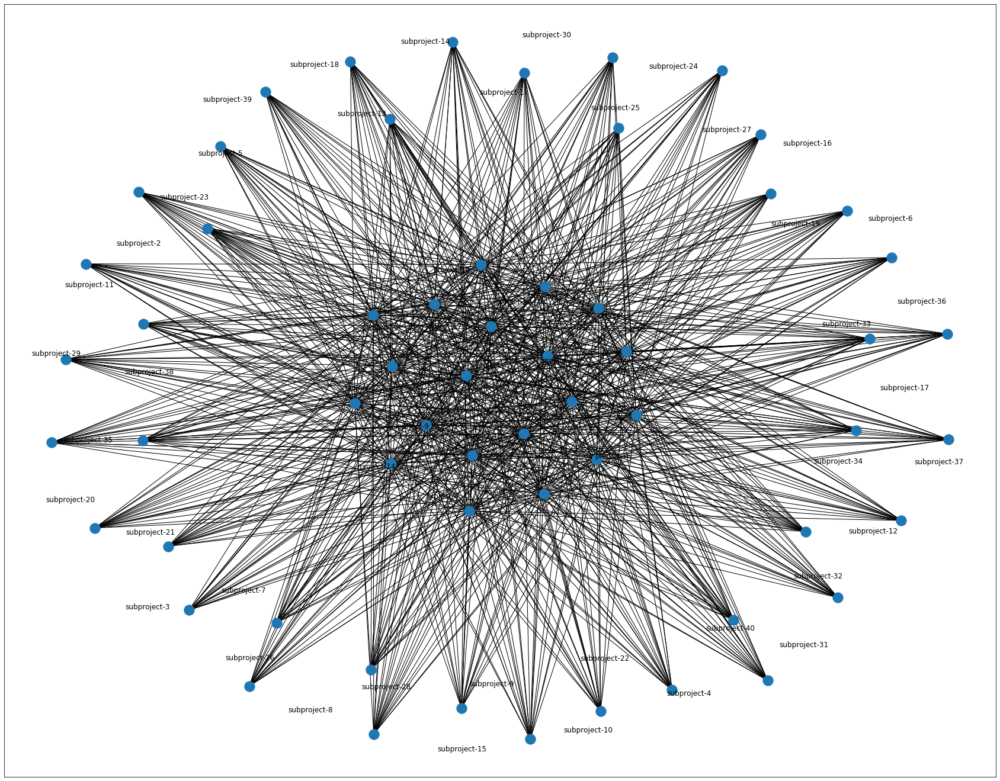

In [21]:
G=nx.from_pandas_edgelist(graph_df, 'project', 'subproject')

plt.figure(figsize = (30,24))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos=pos)
nx.draw_networkx_edges(G, pos=pos)
labels=nx.draw_networkx_labels(G,pos=nx.spring_layout(G))

Generate Sankey visualization

In [22]:
sum_df = train_df.groupby(['project', 'subproject', 'yr-2_oblig']).sum().reset_index()

fig = genSankey(sum_df,cat_cols=['project', 'subproject'],value_cols='yr-2_oblig',title='Project to Subproject Analysis')
po.offline.plot(fig, validate=False)

'temp-plot.html'

#### Subproject to Program List network graph

In [23]:
subproj_list = train_df['subproject'].to_list()
prog_list = train_df['program_title'].to_list()

graph_df_2 = train_df[['subproject', 'program_title']]
graph_df_2

,subproject,program_title
0,subproject-2,program-55
1,subproject-35,program-28
2,subproject-30,program-54
3,subproject-22,program-46
4,subproject-17,program-59
...,...,...
9995,subproject-6,program-77
9996,subproject-25,program-66
9997,subproject-13,program-61
9998,subproject-9,program-18


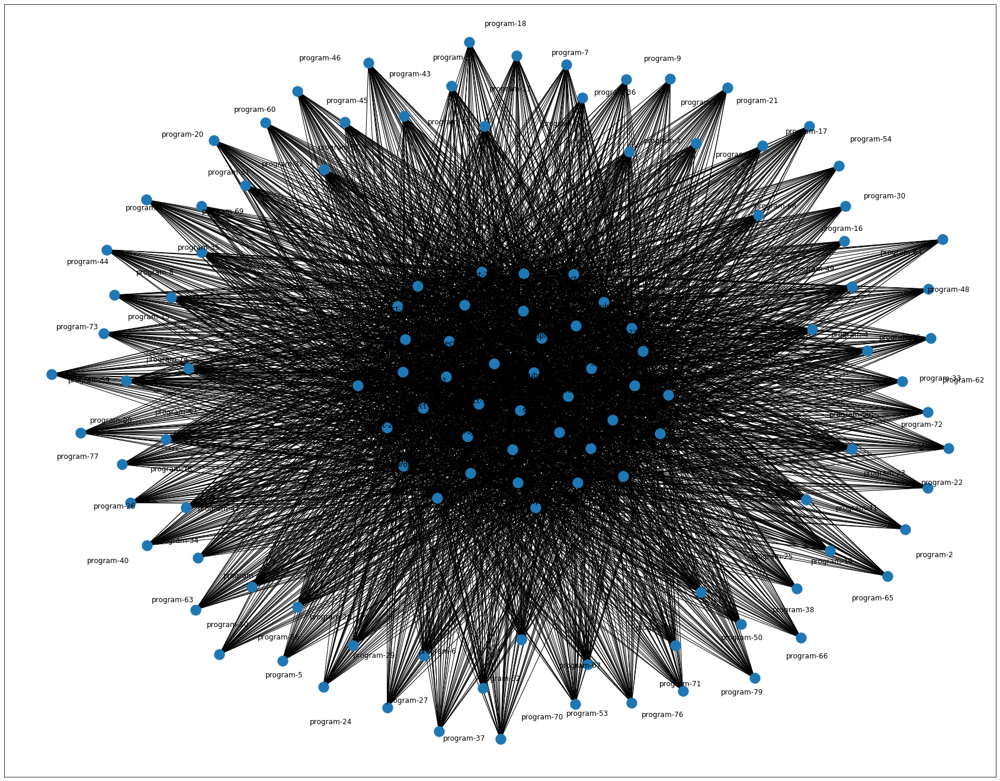

In [24]:
G=nx.from_pandas_edgelist(graph_df_2, 'subproject', 'program_title')

plt.figure(figsize = (30,24))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos=pos)
nx.draw_networkx_edges(G, pos=pos)
labels=nx.draw_networkx_labels(G,pos=nx.spring_layout(G))

In [25]:
sum_df = train_df.groupby(['subproject', 'program_title', 'yr-2_oblig']).sum().reset_index()

fig = genSankey(sum_df,cat_cols=['subproject', 'program_title'],value_cols='yr-2_oblig',title='Subproject to Program Title Analysis')
po.offline.plot(fig, validate=False)

'temp-plot.html'

# PHASE 3: RANDOMIZE EXECUTION DATA 

Section to build out the test data and functions

Create a shallow copy of the completed 'train_df' dataframe in order to conducted stand alone financial execution data analysis

In [241]:
exe_df = train_df.copy()
exe_df.head(5)

,project,subproject,program_title,rca,yr+3_forecast,yr+2_forecast,yr+1_forecast,yr0_plan,yr-1_approp,yr-2_oblig,key
0,project-19,subproject-2,program-55,rca-69,21125,25747.65,24272.40,27489.36,25222.20,21502.50,project-19-subproject-2-program-55-rca-69
1,project-16,subproject-35,program-28,rca-79,27786,18324.06,14946.32,17273.56,13769.40,11054.01,project-16-subproject-35-program-28-rca-79
2,project-16,subproject-30,program-54,rca-50,20664,25425.61,29059.61,22771.04,20498.70,19738.51,project-16-subproject-30-program-54-rca-50
3,project-5,subproject-22,program-46,rca-47,15331,10130.67,11581.67,12890.61,14555.75,13249.48,project-5-subproject-22-program-46-rca-47
4,project-7,subproject-17,program-59,rca-60,3211,3226.34,3742.09,3426.01,3309.25,2996.41,project-7-subproject-17-program-59-rca-60


Extract only the needed categorical columns

In [242]:
exe_slice = exe_df[['key','project','subproject','program_title','rca','yr0_plan']]
exe_slice = exe_slice.rename(columns={'yr0_plan': "usd_value"})
exe_slice.head(5)

,key,project,subproject,program_title,rca,usd_value
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,27489.36
1,project-16-subproject-35-program-28-rca-79,project-16,subproject-35,program-28,rca-79,17273.56
2,project-16-subproject-30-program-54-rca-50,project-16,subproject-30,program-54,rca-50,22771.04
3,project-5-subproject-22-program-46-rca-47,project-5,subproject-22,program-46,rca-47,12890.61
4,project-7-subproject-17-program-59-rca-60,project-7,subproject-17,program-59,rca-60,3426.01


In [243]:
exe_slice['month'] = '12'
exe_slice['year'] = '2019'
exe_slice.head(5)

,key,project,subproject,program_title,rca,usd_value,month,year
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,27489.36,12,2019
1,project-16-subproject-35-program-28-rca-79,project-16,subproject-35,program-28,rca-79,17273.56,12,2019
2,project-16-subproject-30-program-54-rca-50,project-16,subproject-30,program-54,rca-50,22771.04,12,2019
3,project-5-subproject-22-program-46-rca-47,project-5,subproject-22,program-46,rca-47,12890.61,12,2019
4,project-7-subproject-17-program-59-rca-60,project-7,subproject-17,program-59,rca-60,3426.01,12,2019


Create a list of randomized obligated values for month ending 9-30-2019

In [244]:
df_len = len(exe_slice)
eoy_oblig = [random.uniform(0.9, 1.0) for x in range(df_len)]
eoy_oblig

[0.9658361319641117,
 0.9833353871888147,
 0.966861159091503,
 0.9633634358319523,
 0.9589670356291444,
 0.9126990009353984,
 0.9716065240823576,
 0.945231136707932,
 0.9049011504783172,
 0.907266710844457,
 0.9274287992131496,
 0.9383823030692672,
 0.9998178087784815,
 0.9135089212043855,
 0.978091142104016,
 0.9906179887076405,
 0.9601986960868796,
 0.9757919231737222,
 0.912943594058387,
 0.9466637923095045,
 0.9994753617414485,
 0.9755952641851027,
 0.9464011760992627,
 0.9755451468629365,
 0.9847456177384943,
 0.9786585065667012,
 0.9509425757256267,
 0.9922591846139452,
 0.9620333435395958,
 0.9649125620752138,
 0.990807326729145,
 0.9415761192364179,
 0.95341658664994,
 0.9417998149827385,
 0.9361581447833228,
 0.951068255952324,
 0.914570794008311,
 0.9844516467489692,
 0.9453576397719713,
 0.9226569335114653,
 0.9221347164060555,
 0.9900029285276672,
 0.9408309722776165,
 0.9955668522176925,
 0.9488872567619067,
 0.997613109612834,
 0.9126889479925813,
 0.974244594724748,
 0.9

In [245]:
exe_slice['oblig'] = exe_slice['usd_value'] * eoy_oblig
exe_slice

,key,project,subproject,program_title,rca,usd_value,month,year,oblig
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,27489.36,12,2019,26550.217133
1,project-16-subproject-35-program-28-rca-79,project-16,subproject-35,program-28,rca-79,17273.56,12,2019,16985.702811
2,project-16-subproject-30-program-54-rca-50,project-16,subproject-30,program-54,rca-50,22771.04,12,2019,22016.434128
3,project-5-subproject-22-program-46-rca-47,project-5,subproject-22,program-46,rca-47,12890.61,12,2019,12418.342340
4,project-7-subproject-17-program-59-rca-60,project-7,subproject-17,program-59,rca-60,3426.01,12,2019,3285.430654
...,...,...,...,...,...,...,...,...,...
9995,project-17-subproject-6-program-77-rca-21,project-17,subproject-6,program-77,rca-21,31702.33,12,2019,31584.331458
9996,project-5-subproject-25-program-66-rca-46,project-5,subproject-25,program-66,rca-46,10754.11,12,2019,10102.883406
9997,project-18-subproject-13-program-61-rca-15,project-18,subproject-13,program-61,rca-15,16347.71,12,2019,15923.298934
9998,project-9-subproject-9-program-18-rca-78,project-9,subproject-9,program-18,rca-78,5034.08,12,2019,4790.420189


In [246]:
exe_slice['total_authority'] = exe_slice['oblig']
exe_slice[:10]

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,27489.36,12,2019,26550.217133,26550.217133
1,project-16-subproject-35-program-28-rca-79,project-16,subproject-35,program-28,rca-79,17273.56,12,2019,16985.702811,16985.702811
2,project-16-subproject-30-program-54-rca-50,project-16,subproject-30,program-54,rca-50,22771.04,12,2019,22016.434128,22016.434128
3,project-5-subproject-22-program-46-rca-47,project-5,subproject-22,program-46,rca-47,12890.61,12,2019,12418.342340,12418.342340
4,project-7-subproject-17-program-59-rca-60,project-7,subproject-17,program-59,rca-60,3426.01,12,2019,3285.430654,3285.430654
5,project-17-subproject-40-program-24-rca-25,project-17,subproject-40,program-24,rca-25,20430.62,12,2019,18647.006462,18647.006462
6,project-8-subproject-22-program-21-rca-60,project-8,subproject-22,program-21,rca-60,28352.02,12,2019,27547.007603,27547.007603
7,project-15-subproject-6-program-27-rca-100,project-15,subproject-6,program-27,rca-100,5370.44,12,2019,5076.307106,5076.307106
8,project-6-subproject-5-program-63-rca-117,project-6,subproject-5,program-63,rca-117,10291.46,12,2019,9312.753994,9312.753994
9,project-5-subproject-31-program-45-rca-115,project-5,subproject-31,program-45,rca-115,5446.93,12,2019,4941.818265,4941.818265


In [233]:
key_list = list(exe_slice['key'])
key_list

['project-19-subproject-2-program-55-rca-69',
 'project-16-subproject-35-program-28-rca-79',
 'project-16-subproject-30-program-54-rca-50',
 'project-5-subproject-22-program-46-rca-47',
 'project-7-subproject-17-program-59-rca-60',
 'project-17-subproject-40-program-24-rca-25',
 'project-8-subproject-22-program-21-rca-60',
 'project-15-subproject-6-program-27-rca-100',
 'project-6-subproject-5-program-63-rca-117',
 'project-5-subproject-31-program-45-rca-115',
 'project-2-subproject-1-program-4-rca-119',
 'project-12-subproject-21-program-69-rca-73',
 'project-18-subproject-1-program-49-rca-78',
 'project-5-subproject-39-program-62-rca-74',
 'project-16-subproject-5-program-58-rca-104',
 'project-13-subproject-31-program-1-rca-34',
 'project-15-subproject-3-program-12-rca-1',
 'project-19-subproject-17-program-77-rca-73',
 'project-2-subproject-31-program-47-rca-94',
 'project-7-subproject-18-program-17-rca-4',
 'project-8-subproject-9-program-27-rca-31',
 'project-1-subproject-17-prog

In [247]:
exe_slice.dtypes

key                 object
project             object
subproject          object
program_title       object
rca                 object
usd_value          float64
month               object
year                object
oblig              float64
total_authority    float64
dtype: object

## Test one key for the timeseries for loop

In [295]:
temp = exe_app[:1]
temp

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,27489.36,12,2019,25597.203832,25597.203832


In [296]:
for month in range(11): # iterate through the remaining 11 months of the calendar year
    
    print("top of the loop")
    display(temp)
    current_month = 11 - month
    print("Current month: ", current_month)
    
    forward_month = int(current_month) + 1
    print("Forward month: ", forward_month)
    
    converted_month = str(forward_month)
    print("Converted month: ", converted_month)
    
    month_cond = temp['month'].str.startswith(converted_month, na=False) 

    temp_row = temp[month_cond]
    display(temp_row)
    #display(temp_row.iat[0,0])

    key_val = temp.iat[month,0]
    print(key_val)
    
    project_val = temp.iat[month,1]
    print(project_val)
    
    #subproject_val = temp_row.get_value(0, 'subproject') 
    subproject_val = temp.iat[month,2]
    print(subproject_val)
    
    #program_val = temp_row.get_value(0, 'program_title') 
    program_val = temp.iat[month,3]
    print(program_val)
    
    #rca_val = temp_row.get_value(0, 'rca') 
    rca_val = temp.iat[month,4]
    print(rca_val)
    
    #forward_oblig_val = temp_row.get_value(0, 'oblig') 
    forward_oblig_val = temp.iat[month,8]
    print(forward_oblig_val)
    
    current_oblig_val = forward_oblig_val * .8
    print(current_oblig_val)
    
    ta_val = temp.iat[month,9]
    print(ta_val)

    usd_val = 0
    temp = temp.append(pd.DataFrame([[key_val,project_val,subproject_val,program_val,rca_val,usd_val, current_month, '2019', current_oblig_val,ta_val]], columns=temp.columns))
    print('\nAdded row\n')

    

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,27489.36,12,2019,25597.203832,25597.203832


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,27489.36,12,2019,25597.203832,25597.203832


project-19-subproject-2-program-55-rca-69
project-19
subproject-2
program-55
rca-69
25597.203832453168
20477.763065962536
25597.203832453168

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,27489.36,12,2019,25597.203832,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,11,2019,20477.763066,25597.203832


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-19-subproject-2-program-55-rca-69
project-19
subproject-2
program-55
rca-69
20477.763065962536
16382.210452770028
25597.203832453168

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,27489.36,12,2019,25597.203832,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,11,2019,20477.763066,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,10,2019,16382.210453,25597.203832


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-19-subproject-2-program-55-rca-69
project-19
subproject-2
program-55
rca-69
16382.210452770028
13105.768362216024
25597.203832453168

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,27489.36,12,2019,25597.203832,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,11,2019,20477.763066,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,10,2019,16382.210453,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,9,2019,13105.768362,25597.203832


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-19-subproject-2-program-55-rca-69
project-19
subproject-2
program-55
rca-69
13105.768362216024
10484.61468977282
25597.203832453168

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,27489.36,12,2019,25597.203832,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,11,2019,20477.763066,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,10,2019,16382.210453,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,9,2019,13105.768362,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,8,2019,10484.614690,25597.203832


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-19-subproject-2-program-55-rca-69
project-19
subproject-2
program-55
rca-69
10484.61468977282
8387.691751818256
25597.203832453168

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,27489.36,12,2019,25597.203832,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,11,2019,20477.763066,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,10,2019,16382.210453,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,9,2019,13105.768362,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,8,2019,10484.614690,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,7,2019,8387.691752,25597.203832


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-19-subproject-2-program-55-rca-69
project-19
subproject-2
program-55
rca-69
8387.691751818256
6710.153401454605
25597.203832453168

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,27489.36,12,2019,25597.203832,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,11,2019,20477.763066,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,10,2019,16382.210453,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,9,2019,13105.768362,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,8,2019,10484.614690,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,7,2019,8387.691752,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,6,2019,6710.153401,25597.203832


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-19-subproject-2-program-55-rca-69
project-19
subproject-2
program-55
rca-69
6710.153401454605
5368.122721163684
25597.203832453168

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,27489.36,12,2019,25597.203832,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,11,2019,20477.763066,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,10,2019,16382.210453,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,9,2019,13105.768362,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,8,2019,10484.614690,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,7,2019,8387.691752,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,6,2019,6710.153401,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,5,2019,5368.122721,25597.203832


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-19-subproject-2-program-55-rca-69
project-19
subproject-2
program-55
rca-69
5368.122721163684
4294.498176930948
25597.203832453168

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,27489.36,12,2019,25597.203832,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,11,2019,20477.763066,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,10,2019,16382.210453,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,9,2019,13105.768362,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,8,2019,10484.614690,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,7,2019,8387.691752,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,6,2019,6710.153401,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,5,2019,5368.122721,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,4,2019,4294.498177,25597.203832


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-19-subproject-2-program-55-rca-69
project-19
subproject-2
program-55
rca-69
4294.498176930948
3435.5985415447585
25597.203832453168

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,27489.36,12,2019,25597.203832,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,11,2019,20477.763066,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,10,2019,16382.210453,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,9,2019,13105.768362,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,8,2019,10484.614690,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,7,2019,8387.691752,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,6,2019,6710.153401,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,5,2019,5368.122721,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,4,2019,4294.498177,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,3,2019,3435.598542,25597.203832


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-19-subproject-2-program-55-rca-69
project-19
subproject-2
program-55
rca-69
3435.5985415447585
2748.478833235807
25597.203832453168

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,27489.36,12,2019,25597.203832,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,11,2019,20477.763066,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,10,2019,16382.210453,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,9,2019,13105.768362,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,8,2019,10484.614690,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,7,2019,8387.691752,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,6,2019,6710.153401,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,5,2019,5368.122721,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,4,2019,4294.498177,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,3,2019,3435.598542,25597.203832


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-19-subproject-2-program-55-rca-69
project-19
subproject-2
program-55
rca-69
2748.478833235807
2198.783066588646
25597.203832453168

Added row



In [297]:
temp

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,27489.36,12,2019,25597.203832,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,11,2019,20477.763066,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,10,2019,16382.210453,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,9,2019,13105.768362,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,8,2019,10484.614690,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,7,2019,8387.691752,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,6,2019,6710.153401,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,5,2019,5368.122721,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,4,2019,4294.498177,25597.203832
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,0.00,3,2019,3435.598542,25597.203832


In [180]:
val = temp.iat[0,0]
val

'project-19-subproject-2-program-55-rca-69'

## Consolidated timeseries generated loop

In [299]:
temp2 = exe_app.copy()
temp2[:5]

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-19-subproject-2-program-55-rca-69,project-19,subproject-2,program-55,rca-69,27489.36,12,2019,25597.203832,25597.203832
1,project-16-subproject-35-program-28-rca-79,project-16,subproject-35,program-28,rca-79,17273.56,12,2019,16618.833639,16618.833639
2,project-16-subproject-30-program-54-rca-50,project-16,subproject-30,program-54,rca-50,22771.04,12,2019,22687.469092,22687.469092
3,project-5-subproject-22-program-46-rca-47,project-5,subproject-22,program-46,rca-47,12890.61,12,2019,12354.389432,12354.389432
4,project-7-subproject-17-program-59-rca-60,project-7,subproject-17,program-59,rca-60,3426.01,12,2019,3314.292921,3314.292921


In [ ]:
for key in key_list:
    
    for month in range(11): # iterate through the remaining 11 months of the calendar year

        print("Beginning start of the new month ... ")
        display(temp2)
        current_month = 11 - month
        print("Current month: ", current_month)

        forward_month = int(current_month) + 1
        print("Forward month: ", forward_month)

        converted_month = str(forward_month)
        print("Converted month: ", converted_month)

        month_cond = temp2['month'].str.startswith(converted_month, na=False) 
        key_cond = temp2['key'].str.startswith(key, na=False)
        temp_row = temp2[month_cond & key_cond]
        display(temp_row)
        #display(temp_row.iat[0,0])

        key_val = temp2.iat[month,0]
        print(key_val)

        project_val = temp2.iat[month,1]
        print(project_val)

        #subproject_val = temp_row.get_value(0, 'subproject') 
        subproject_val = temp2.iat[month,2]
        print(subproject_val)

        #program_val = temp_row.get_value(0, 'program_title') 
        program_val = temp2.iat[month,3]
        print(program_val)

        #rca_val = temp_row.get_value(0, 'rca') 
        rca_val = temp2.iat[month,4]
        print(rca_val)

        #forward_oblig_val = temp_row.get_value(0, 'oblig') 
        forward_oblig_val = temp2.iat[month,8]
        print(forward_oblig_val)

        current_oblig_val = forward_oblig_val * .8
        print(current_oblig_val)

        ta_val = temp2.iat[month,9]
        print(ta_val)

        usd_val = 0
        temp2 = temp2.append(pd.DataFrame([[key_val,project_val,subproject_val,program_val,rca_val,usd_val, current_month, '2019', current_oblig_val,ta_val]], columns=temp.columns))
        print('\nAdded month row, restarting inner loop ... \n')



# END OF PROGRAM

"Si vacem para bellum"

# TEST SECTION

In [31]:
num_exe_proj = 15
num_exe_subproj = 30
num_exe_rca = 50
num_exe_program = 75

num_of_kc = 10
is_base = 1
is_nip = 1

In [32]:
exe_proj_list = ['proj-' + str(x) for x in range(num_exe_proj)]
exe_proj_list[:5]

['proj-0', 'proj-1', 'proj-2', 'proj-3', 'proj-4']

In [33]:
exe_subproj_list = ['subproj-' + str(x) for x in range(num_exe_subproj)]
exe_subproj_list[:5]

['subproj-0', 'subproj-1', 'subproj-2', 'subproj-3', 'subproj-4']

In [34]:
exe_rca_list = ['rca-' + str(x) for x in range(num_exe_rca)]
exe_rca_list[:5]

['rca-0', 'rca-1', 'rca-2', 'rca-3', 'rca-4']

In [35]:
exe_prog_list = ['program-' + str(x) for x in range(num_exe_program)]
exe_prog_list[:5]

['program-0', 'program-1', 'program-2', 'program-3', 'program-4']

# PHASE 4: EXPORT DATA

In [36]:
train_df.to_csv(r'locked_random_data_v1', index = False)